In [ ]:
import math
import numpy as np
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DTYPE = torch.float64

def cd_step_gpu(x, y, z, a, b, c, h):
    s = 0.5
    h1 = s * h
    h2 = (1 - s) * h

    # D1
    x1 = (x + h1 * a * y) / (1 + h1 * a)
    y1 = (y + h1 * ((c - a) * x1 - x1 * z)) / (1 - h1 * c)
    z1 = (z + h1 * x1 * y1) / (1 + h1 * b)

    # D2
    z2 = z1 + h2 * (x1 * y1 - b * z1)
    y2 = y1 + h2 * ((c - a) * x1 - x1 * z2 + c * y1)
    x2 = x1 + h2 * a * (y2 - x1)

    return x2, y2, z2

def integrate_batch_cd_torch(a_batch, b_batch, c_batch, x0=(1.,1.,1.), t_transient=0.0, t_sample=100.0, dt=0.001, device=DEVICE):
    a_t = torch.as_tensor(a_batch, dtype=DTYPE, device=device)
    b_t = torch.as_tensor(b_batch, dtype=DTYPE, device=device)
    c_t = torch.as_tensor(c_batch, dtype=DTYPE, device=device)
    B = a_t.shape[0]

    x = torch.full((B,), float(x0[0]), dtype=DTYPE, device=device)
    y = torch.full((B,), float(x0[1]), dtype=DTYPE, device=device)
    z = torch.full((B,), float(x0[2]), dtype=DTYPE, device=device)

    if t_transient > 0:
        steps_tr = int(math.ceil(t_transient / dt))
        for _ in range(steps_tr):
            x, y, z = cd_step_gpu(x, y, z, a_t, b_t, c_t, dt)
            bad = ~torch.isfinite(x) | ~torch.isfinite(y) | ~torch.isfinite(z) | (x.abs() > 1e6) | (y.abs() > 1e6) | (z.abs() > 1e6)
            if bad.any():
                x = torch.where(bad, torch.zeros_like(x), x)
                y = torch.where(bad, torch.zeros_like(y), y)
                z = torch.where(bad, torch.zeros_like(z), z)

    steps_sample = int(math.ceil(t_sample / dt))
    traj_x = torch.empty((steps_sample, B), dtype=DTYPE, device=device)
    for i in range(steps_sample):
        x, y, z = cd_step_gpu(x, y, z, a_t, b_t, c_t, dt)
        bad = ~torch.isfinite(x) | ~torch.isfinite(y) | ~torch.isfinite(z) | (x.abs() > 1e6) | (y.abs() > 1e6) | (z.abs() > 1e6)
        if bad.any():
            x = torch.where(bad, torch.zeros_like(x), x)
            y = torch.where(bad, torch.zeros_like(y), y)
            z = torch.where(bad, torch.zeros_like(z), z)
        traj_x[i] = x

    return traj_x.detach().cpu().numpy()

def dbscan_1d(vals, eps=0.2, min_samples=1):
    vals = np.asarray(vals, dtype=float)
    N = vals.size
    if N == 0:
        return np.array([], dtype=int), 0
    if N == 1:
        label = np.array([0], dtype=int) if min_samples <= 1 else np.array([-1], dtype=int)
        return label, (1 if min_samples <= 1 else 0)

    idx = np.argsort(vals)
    s = vals[idx]
    gaps = np.diff(s)
    splits = np.where(gaps > eps)[0]
    groups = []
    start = 0
    for sp in splits:
        groups.append((start, sp))
        start = sp + 1
    groups.append((start, s.size - 1))

    labels_sorted = np.full(s.shape[0], -1, dtype=int)
    cluster_id = 0
    for (st, en) in groups:
        cnt = en - st + 1
        if cnt >= min_samples:
            labels_sorted[st:en+1] = cluster_id
            cluster_id += 1
        else:
            labels_sorted[st:en+1] = -1

    labels = np.full_like(labels_sorted, -1)
    labels[idx] = labels_sorted
    return labels, cluster_id

def analyze_batch_params(
    a_batch, b_batch, c_batch,
    x0=(1.,1.,1.),
    t_transient=50.0, t_sample=120.0, dt=0.001,
    eps=0.15, min_samples=3,
    device=DEVICE
):
    traj_x = integrate_batch_cd_torch(a_batch, b_batch, c_batch, x0=x0, t_transient=t_transient, t_sample=t_sample, dt=dt, device=device)
    steps, B = traj_x.shape
    counts = np.zeros(B, dtype=np.int32)
    for j in range(B):
        series = traj_x[:, j]
        peaks_idx, _ = find_peaks(series)
        if peaks_idx.size == 0:
            counts[j] = 0
            continue
        peaks_vals = series[peaks_idx]
        peaks_vals = peaks_vals[np.isfinite(peaks_vals) & (np.abs(peaks_vals) < 1e6)]
        if peaks_vals.size == 0:
            counts[j] = 0
            continue
        _, cluster_num = dbscan_1d(peaks_vals, eps=eps, min_samples=min_samples)
        counts[j] = cluster_num
    return counts

def two_param_period_map_torch(
    p1_name="a", p2_name="c",
    ranges = None,
    steps = 200,
    dt=0.001, t_transient=60.0, t_sample=140.0,
    eps=0.15, min_samples=3,
    batch_size=1024,
    x0=(1.,1.,1.),
    device=DEVICE,
    save_png="chen_2param_period_map.png",
    save_npz="chen_2param_period_map.npz",
    show_plot=True
):
    if ranges is None:
        ranges = {'c':(20.0,30.0), 'a':(35.0,45.0), 'b':(0.0,4.0)}
    assert p1_name in ('a','b','c') and p2_name in ('a','b','c') and p1_name != p2_name, "Choose two distinct params from 'a','b','c'."

    if isinstance(steps, int):
        n1 = n2 = steps
    else:
        n1, n2 = steps

    p1_vals = np.linspace(ranges[p1_name][0], ranges[p1_name][1], n1, dtype=float)
    p2_vals = np.linspace(ranges[p2_name][0], ranges[p2_name][1], n2, dtype=float)

    P1_grid, P2_grid = np.meshgrid(p1_vals, p2_vals, indexing='xy')
    P1_flat = P1_grid.T.reshape(-1)
    P2_flat = P2_grid.T.reshape(-1)
    N = P1_flat.size

    cluster_counts_flat = np.zeros(N, dtype=np.int32)

    iters = math.ceil(N / batch_size)
    pbar = tqdm(total=N, desc=f"Sweeping {p1_name} vs {p2_name}", unit="cells")
    for it in range(iters):
        start = it * batch_size
        end = min(start + batch_size, N)
        B = end - start

        a_batch = np.full(B, 40.0, dtype=float)
        b_batch = np.full(B, 3.0, dtype=float)
        c_batch = np.full(B, 28.0, dtype=float)

        if p1_name == 'a':
            a_batch[:] = P1_flat[start:end]
        elif p1_name == 'b':
            b_batch[:] = P1_flat[start:end]
        else:
            c_batch[:] = P1_flat[start:end]

        if p2_name == 'a':
            a_batch[:] = P2_flat[start:end]
        elif p2_name == 'b':
            b_batch[:] = P2_flat[start:end]
        else:
            c_batch[:] = P2_flat[start:end]

        counts = analyze_batch_params(a_batch, b_batch, c_batch, x0=x0, t_transient=t_transient, t_sample=t_sample, dt=dt, eps=eps, min_samples=min_samples, device=device)
        cluster_counts_flat[start:end] = counts
        pbar.update(B)
    pbar.close()

    grid = cluster_counts_flat.reshape((n1, n2))

    np.savez_compressed(save_npz, p1_name=p1_name, p2_name=p2_name, p1_vals=p1_vals, p2_vals=p2_vals, grid=grid)
    print(f"Saved data to {save_npz}")

    fig, ax = plt.subplots(figsize=(10,8), dpi=200)
    im = ax.imshow(grid.T, origin='lower',
                   extent=(p1_vals.min(), p1_vals.max(), p2_vals.min(), p2_vals.max()),
                   aspect='auto', cmap='turbo', interpolation='nearest')
    ax.set_xlabel(p1_name, fontsize=12)
    ax.set_ylabel(p2_name, fontsize=12)
    ax.set_title(f"Chen period map ({p1_name} vs {p2_name})", fontsize=14)
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Number of DBSCAN clusters (periods)")
    plt.tight_layout()
    if save_png:
        fig.savefig(save_png, dpi=300)
        print(f"Saved figure to {save_png}")
    if show_plot:
        plt.show()
    plt.close(fig)

    return p1_vals, p2_vals, grid


Device: cpu
Building map a vs c ...


Sweeping a vs c:   0%|          | 0/10000 [00:00<?, ?cells/s]

Saved data to chen_map_a_c.npz
Saved figure to chen_map_a_c.png


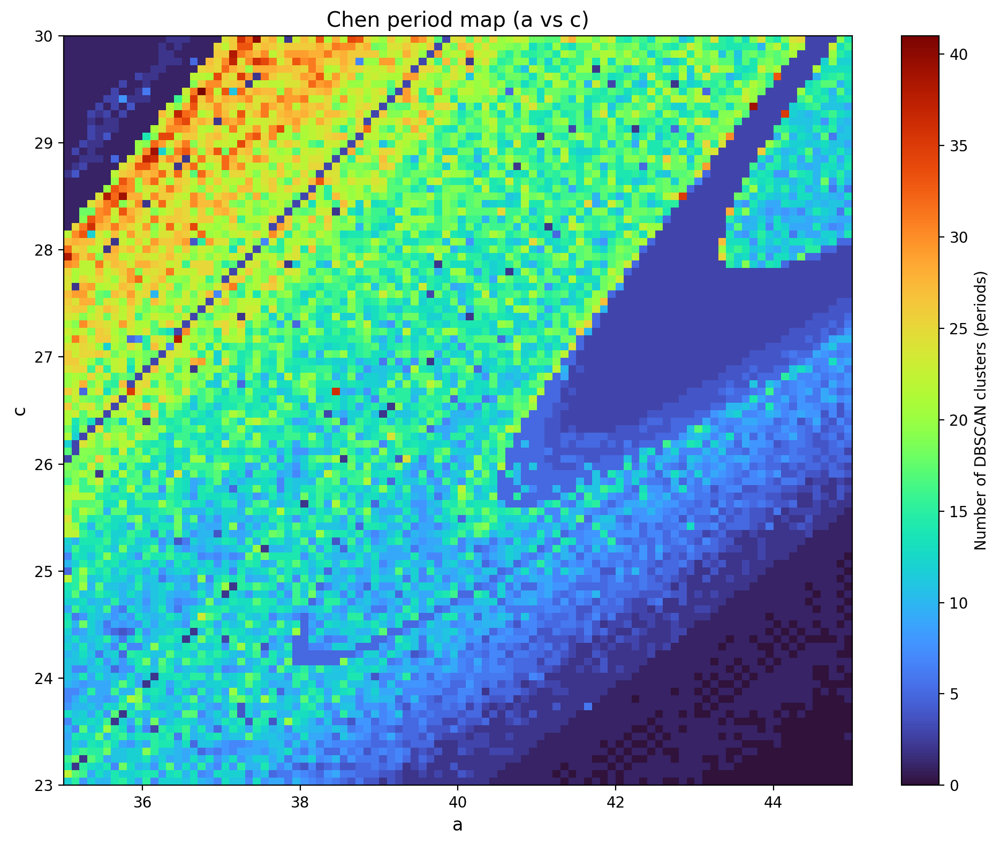

Finished a vs c.
Building map b vs c ...


Sweeping b vs c:   0%|          | 0/10000 [00:00<?, ?cells/s]

Saved data to chen_map_b_c.npz
Saved figure to chen_map_b_c.png


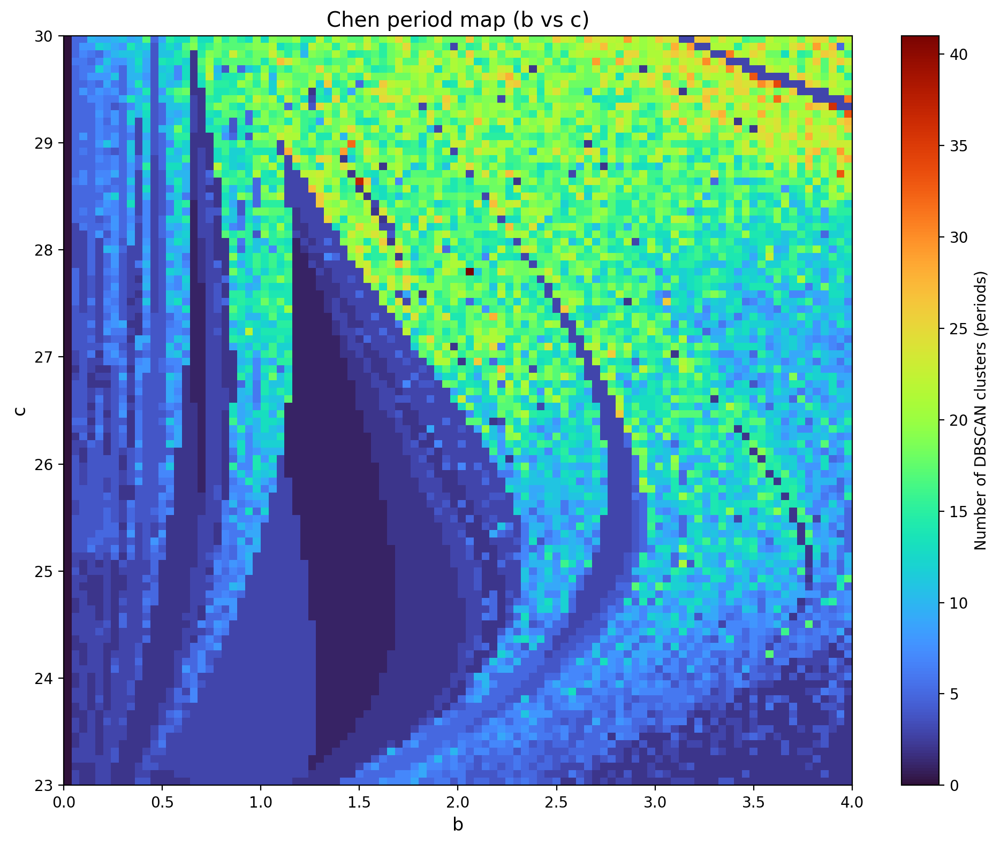

Finished b vs c.
Building map a vs b ...


Sweeping a vs b:   0%|          | 0/10000 [00:00<?, ?cells/s]

Saved data to chen_map_a_b.npz
Saved figure to chen_map_a_b.png


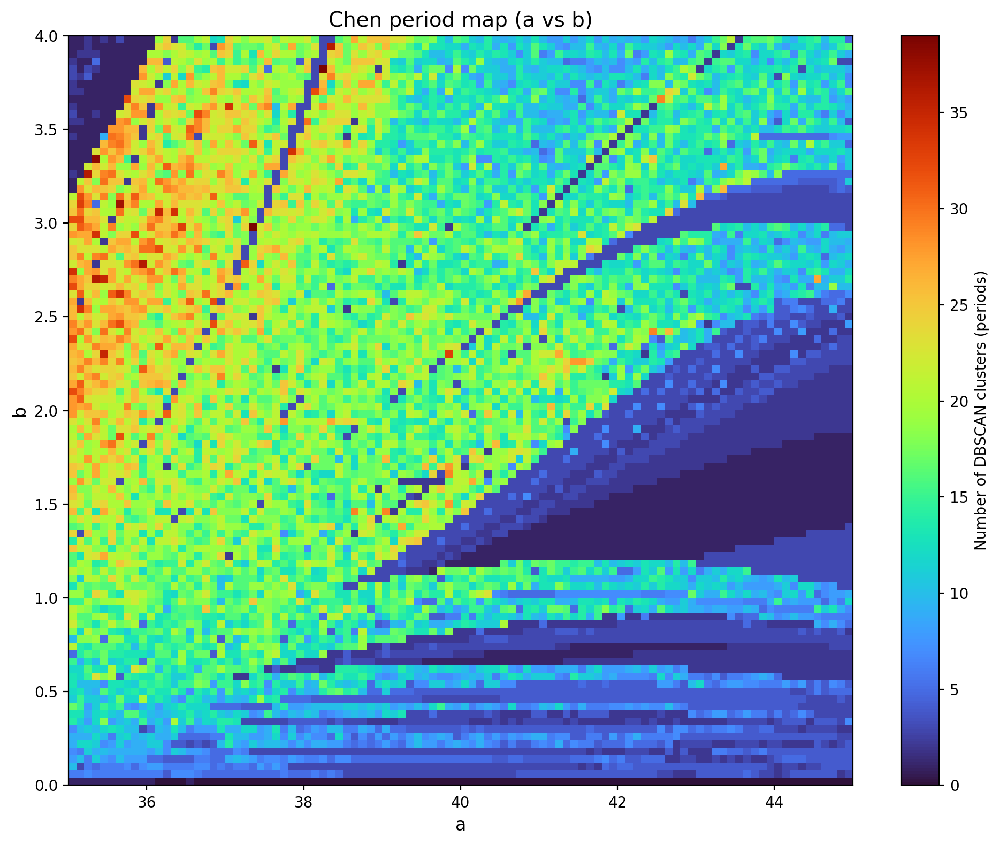

Finished a vs b.


In [ ]:
if __name__ == "__main__":
    print("Device:", DEVICE)

    ranges = {'c':(23.0,30.0), 'a':(35.0,45.0), 'b':(0.0,4.0)}

    maps_to_build = [('a','c'), ('b','c'), ('a','b')]
    steps = 100

    for (p1,p2) in maps_to_build:
        out_png = f"chen_map_{p1}_{p2}.png"
        out_npz = f"chen_map_{p1}_{p2}.npz"
        print(f"Building map {p1} vs {p2} ...")
        p1_vals, p2_vals, grid = two_param_period_map_torch(
            p1_name=p1, p2_name=p2,
            ranges=ranges, steps=steps,
            dt=0.0025, t_transient=500.0, t_sample=500.0,
            eps=0.15, min_samples=1,
            batch_size=1024,
            x0=(1.0,1.0,1.0),
            device=DEVICE,
            save_png=out_png,
            save_npz=out_npz,
            show_plot=True
        )
        print(f"Finished {p1} vs {p2}.")

Device: cuda
Building map b vs c ...


Sweeping b vs c:   0%|          | 0/32400 [00:00<?, ?cells/s]

Saved data to chen_map_b_c.npz
Saved figure to chen_map_b_c.png


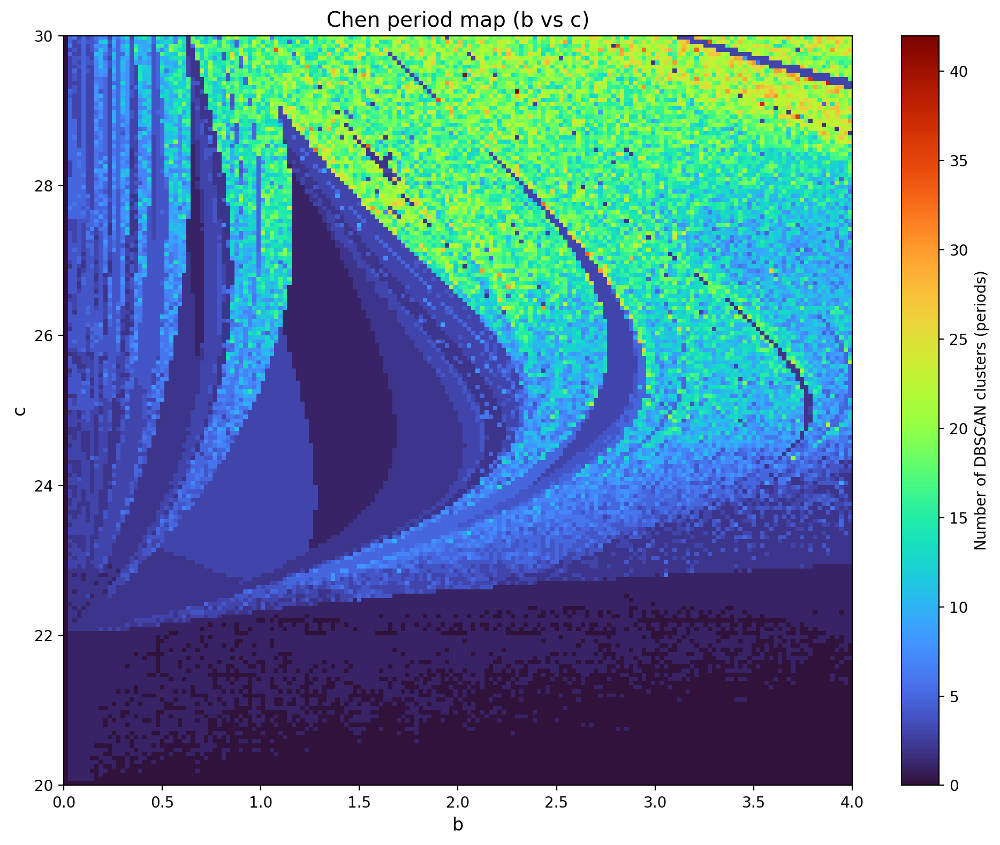

Finished b vs c.
Building map a vs b ...


Sweeping a vs b:   0%|          | 0/32400 [00:00<?, ?cells/s]

In [ ]:
if __name__ == "__main__":
    print("Device:", DEVICE)

    ranges = {'c':(20.0,30.0), 'a':(35.0,45.0), 'b':(0.0,4.0)}

    maps_to_build = [('b','c'), ('a','b')]
    steps = 180

    for (p1,p2) in maps_to_build:
        out_png = f"chen_map_{p1}_{p2}.png"
        out_npz = f"chen_map_{p1}_{p2}.npz"
        print(f"Building map {p1} vs {p2} ...")
        p1_vals, p2_vals, grid = two_param_period_map_torch(
            p1_name=p1, p2_name=p2,
            ranges=ranges, steps=steps,
            dt=0.0025, t_transient=500.0, t_sample=500.0,
            eps=0.15, min_samples=1,
            batch_size=1024,
            x0=(1.0,1.0,1.0),
            device=DEVICE,
            save_png=out_png,
            save_npz=out_npz,
            show_plot=True
        )
        print(f"Finished {p1} vs {p2}.")

In [ ]:
if __name__ == "__main__":
    print("Device:", DEVICE)

    ranges = {'c':(20.0,30.0), 'a':(35.0,45.0), 'b':(0.0,4.0)}

    maps_to_build = [('a','b')]
    steps = 180

    for (p1,p2) in maps_to_build:
        out_png = f"chen_map_{p1}_{p2}.png"
        out_npz = f"chen_map_{p1}_{p2}.npz"
        print(f"Building map {p1} vs {p2} ...")
        p1_vals, p2_vals, grid = two_param_period_map_torch(
            p1_name=p1, p2_name=p2,
            ranges=ranges, steps=steps,
            dt=0.0025, t_transient=500.0, t_sample=500.0,
            eps=0.15, min_samples=1,
            batch_size=1024,
            x0=(1.0,1.0,1.0),
            device=DEVICE,
            save_png=out_png,
            save_npz=out_npz,
            show_plot=True
        )
        print(f"Finished {p1} vs {p2}.")

Device: cuda
Building map a vs b ...


Sweeping a vs b:   0%|          | 0/32400 [00:00<?, ?cells/s]

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from tqdm.auto import tqdm

# try S-G smoothing if available
try:
    from scipy.signal import savgol_filter
    _HAS_SAVGOL = True
except Exception:
    _HAS_SAVGOL = False

torch.set_default_dtype(torch.float64)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


# ---------------- CD step (your original) ----------------
def cd_step_gpu(x, y, z, a, b, c, h):
    s = 0.5
    h1 = s * h
    h2 = (1 - s) * h

    # D1
    x1 = (x + h1 * a * y) / (1 + h1 * a)
    y1 = (y + h1 * ((c - a) * x1 - x1 * z)) / (1 - h1 * c)
    z1 = (z + h1 * x1 * y1) / (1 + h1 * b)

    # D2
    z2 = z1 + h2 * (x1 * y1 - b * z1)
    y2 = y1 + h2 * ((c - a) * x1 - x1 * z2 + c * y1)
    x2 = x1 + h2 * a * (y2 - x1)

    return x2, y2, z2


# ---------------- Integrator (batched) ----------------
def integrate_chen_cd_gpu(a, b, c, s0, tmax, dt, device="cuda", dtype=torch.float32):
    """
    Batched integration of CD-step.
    - a,b,c: torch tensors shape (B,)
    - s0: either tuple (x0,y0,z0) or tensor (B,3)
    - returns: traj_x (steps, B) as dtype (float32 by default), and last x,y,z tensors (dtype of a)
    """
    steps = int(np.ceil(tmax / dt))
    B = a.shape[0] if torch.is_tensor(a) else len(a)

    if isinstance(s0, torch.Tensor) and s0.ndim == 2:
        x = s0[:, 0].to(device=device, dtype=a.dtype)
        y = s0[:, 1].to(device=device, dtype=a.dtype)
        z = s0[:, 2].to(device=device, dtype=a.dtype)
    else:
        x0, y0, z0 = s0
        x = torch.full((B,), float(x0), device=device, dtype=a.dtype)
        y = torch.full((B,), float(y0), device=device, dtype=a.dtype)
        z = torch.full((B,), float(z0), device=device, dtype=a.dtype)

    # store x in float32 to save memory and bandwidth
    traj_x = torch.zeros((steps, B), device="cpu", dtype=torch.float32)

    for i in range(steps):
        x, y, z = cd_step_gpu(x, y, z, a, b, c, dt)
        # protection: if any exploded, mark that param as bad by filling NaN later
        mask = torch.isfinite(x) & torch.isfinite(y) & torch.isfinite(z) & (torch.abs(x) < 1e4)
        if not mask.all():
            # set exploded entries to NaN (on CPU buffer) and keep integration but zero them on GPU to avoid inf propagation
            xp = x.detach().cpu().to(torch.float32).numpy()
            xp[~mask.detach().cpu().numpy()] = np.nan
            traj_x[i, :] = torch.from_numpy(xp)
            # silence exploded on device to avoid blowup in subsequent steps
            x = torch.where(mask, x, torch.zeros_like(x))
            y = torch.where(mask, y, torch.zeros_like(y))
            z = torch.where(mask, z, torch.zeros_like(z))
        else:
            traj_x[i, :] = x.detach().cpu().to(torch.float32)
    return traj_x, x, y, z


# ---------------- Peak detection helpers ----------------
def adaptive_find_peaks(x_series, smoothing=True, savgol_window=51, savgol_poly=3,
                        prominence_factor=0.5, distance=None):
    """
    Robust peak detection:
      - optional smoothing (S-G filter) if available
      - adaptive prominence = prominence_factor * std(x_series)
      - returns peaks indices (np.array)
    """
    if np.all(np.isnan(x_series)):
        return np.array([], dtype=int)

    # clean NaNs by replacing with median
    if np.isnan(x_series).any():
        med = np.nanmedian(x_series)
        x_clean = np.where(np.isnan(x_series), med, x_series)
    else:
        x_clean = x_series

    # smoothing
    if smoothing and _HAS_SAVGOL:
        # window must be odd and <= len
        win = min(savgol_window, len(x_clean) // 2 * 2 + 1)
        if win < 5:
            win = 5 if len(x_clean) >= 5 else 3
        try:
            xs = savgol_filter(x_clean, win, savgol_poly)
        except Exception:
            xs = x_clean
    else:
        xs = x_clean

    std = np.nanstd(xs)
    if std == 0 or np.isnan(std):
        std = 1e-12

    prominence = max(1e-6, prominence_factor * std)
    # distance: minimal samples between peaks; default ~ 1/100 of length
    if distance is None:
        distance = max(1, len(xs) // 200)

    peaks, props = find_peaks(xs, prominence=prominence, distance=distance)
    return peaks


def sliding_window_max(x_series, window=50, step=1):
    """
    Fallback: form sliding window maxima (slow but robust).
    Returns values of local window maxima (not indices).
    """
    n = len(x_series)
    vals = []
    for i in range(0, n - window + 1, step):
        win = x_series[i:i+window]
        if np.isnan(win).all():
            continue
        vals.append(np.nanmax(win))
    return np.array(vals)


# ---------------- Main improved simulate function ----------------
def simulate_chen_param_sweep_gpu(
    param_name="c",
    param_min=20.0,
    param_max=35.0,
    num_params=1500,
    a_base=35.0,
    b_base=3.0,
    c_base=28.0,
    dt=0.0025,
    t_transient=500.0,
    t_sample=500.0,
    s0=(1.0, 1.0, 1.0),
    max_points_per_param=800,
    device="cuda",
    batch_size=200,
    prominence_factor=0.6,
    smoothing=True,
    savgol_window=51,
    savgol_poly=3,
    fallback_window=200
):
    """
    Robust bifurcation scan with GPU integration and adaptive peak detection.
    - batch_size: how many parameter values to process on GPU at once
    - prominence_factor: scales the adaptive prominence threshold
    - smoothing: whether to apply savgol smoothing before find_peaks (if scipy available)
    """

    params_all = np.linspace(param_min, param_max, num_params, dtype=np.float32)
    all_pairs = []

    # process in batches
    for batch_start in tqdm(range(0, num_params, batch_size), desc="Batches"):
        batch_end = min(num_params, batch_start + batch_size)
        p_batch = params_all[batch_start:batch_end]
        B = len(p_batch)

        # build parameter tensors on device (float32 for speed)
        a = torch.full((B,), float(a_base), device=device, dtype=torch.float32)
        b = torch.full((B,), float(b_base), device=device, dtype=torch.float32)
        c = torch.full((B,), float(c_base), device=device, dtype=torch.float32)

        if param_name == "a":
            a = torch.tensor(p_batch, device=device, dtype=torch.float32)
        elif param_name == "b":
            b = torch.tensor(p_batch, device=device, dtype=torch.float32)
        elif param_name == "c":
            c = torch.tensor(p_batch, device=device, dtype=torch.float32)
        else:
            raise ValueError("param_name must be one of 'a', 'b', or 'c'")

        # 1) transient: integrate to last state
        with torch.no_grad():
            tr_x, tr_x_last, tr_y_last, tr_z_last = integrate_chen_cd_gpu(a, b, c, s0, tmax=t_transient, dt=dt, device=device, dtype=torch.float32)

            # build last state tensor (B,3)
            tr_s = torch.stack([tr_x_last, tr_y_last, tr_z_last], dim=-1)

            # 2) sample attractor
            traj_x, _, _, _ = integrate_chen_cd_gpu(a, b, c, tr_s, tmax=t_sample, dt=dt, device=device, dtype=torch.float32)

        # traj_x shape: (steps, B) on CPU float32
        traj_np = traj_x.numpy()  # shape (steps, B)
        # convert params for this batch to numpy
        p_batch_np = p_batch

        # analyze each series in this batch on CPU
        for i in range(B):
            x_series = traj_np[:, i].astype(np.float64)  # promote to float64 for analysis

            # if many NaNs or nearly all zeros => skip parameter (exploded or degenerate)
            n_valid = np.count_nonzero(~np.isnan(x_series))
            if n_valid < max(10, 0.01 * len(x_series)):
                continue

            # 1) try adaptive find_peaks
            peaks = adaptive_find_peaks(x_series, smoothing=smoothing, savgol_window=savgol_window,
                                        savgol_poly=savgol_poly, prominence_factor=prominence_factor)

            if peaks.size == 0:
                # fallback: sliding window maxima
                sw = sliding_window_max(x_series, window=min(fallback_window, max(5, len(x_series)//50)), step=1)
                if sw.size == 0:
                    continue
                # take last max_points_per_param maxima
                vals = sw[-max_points_per_param:]
                for val in vals:
                    all_pairs.append([float(p_batch_np[i]), float(val)])
                continue

            # compute peak values and trim to last max_points_per_param
            x_peaks = x_series[peaks]
            if len(x_peaks) > max_points_per_param:
                x_peaks = x_peaks[-max_points_per_param:]
            for val in x_peaks:
                if np.isfinite(val) and abs(val) < 1e3:
                    all_pairs.append([float(p_batch_np[i]), float(val)])

    all_pairs = np.array(all_pairs, dtype=np.float32)
    if all_pairs.size == 0:
        print("No valid peaks found for given parameters and integration settings.")
        return all_pairs

    # final mask for safety
    mask = np.isfinite(all_pairs[:, 1]) & (np.abs(all_pairs[:, 1]) < 1e3)
    all_pairs = all_pairs[mask]

    # ---- plotting ----
    plt.figure(figsize=(18, 10), dpi=400)
    plt.scatter(all_pairs[:, 0], all_pairs[:, 1], s=0.3, alpha=0.6, color="#003366", rasterized=True)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("x peaks", fontsize=14)
    plt.title(f"Chen system — GPU Composite-Diagonal bifurcation by {param_name}", fontsize=16)
    plt.tight_layout()
    plt.show()

    return all_pairs


Using device: cuda


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

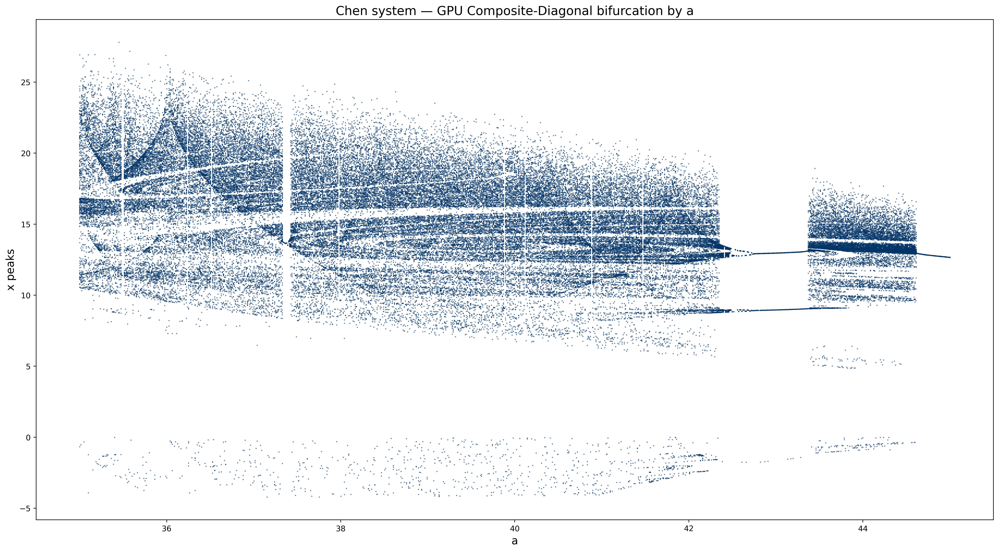

In [ ]:
# быстрый тест (уменьши num_params/время для дебага)
pairs = simulate_chen_param_sweep_gpu(
    param_name="a",
    param_min=35.0,
    param_max=45.0,
    num_params=800,
    b_base=3.0,
    c_base=28.0,
    dt=0.0025,
    t_transient=500.0,
    t_sample=500.0,
    s0=(1.0,1.0,1.0),
    max_points_per_param=800,
    batch_size=200,
    prominence_factor=0.6,
    smoothing=True
)


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

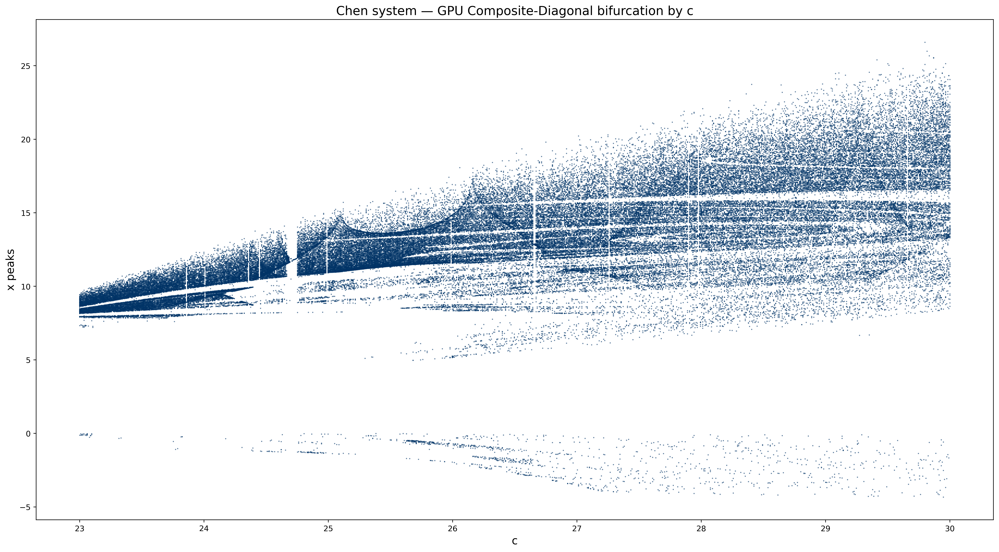

In [ ]:
# быстрый тест (уменьши num_params/время для дебага)
pairs = simulate_chen_param_sweep_gpu(
    param_name="c",
    param_min=23.0,
    param_max=30.0,
    num_params=800,
    b_base=3.0,
    a_base=40.0,
    dt=0.0025,
    t_transient=500.0,
    t_sample=500.0,
    s0=(1.0,1.0,1.0),
    max_points_per_param=800,
    batch_size=200,
    prominence_factor=0.6,
    smoothing=True
)
